# Edge Aware Filters
1. Domain Transformation Algorithm (https://docs.opencv.org/4.5.4/df/dac/group__photo__render.html)
- https://www.inf.ufrgs.br/~eslgastal/DomainTransform/Gastal_Oliveira_SIGGRAPH2011_Domain_Transform.pdf, ACM TOG Vol 30, No. 4, 2011.

- The filter preserves edges in the images.

2. Bilateral Filter (https://docs.opencv.org/4.x/d4/d13/tutorial_py_filtering.html)

### References
- https://docs.opencv.org/4.5.4/df/dac/group__photo__render.html
- https://www.inf.ufrgs.br/~eslgastal/DomainTransform/ 
- https://learnopencv.com/non-photorealistic-rendering-using-opencv-python-c/

### Parameters
1. $\sigma_s$ : to determine how many neighboring pixels are used in averaging (domain space smoothing)
2. $\sigma_r$ : to control how colors will be averaged (color space smoothing)
3. shade_factor : to control the intensity of output image.
4. flags
    - RECURS_FILTER ( Recursive Filtering ) = 1 
    - NORMCONV_FILTER ( Normalized Convolution ) = 2. 
    - Using RECURS_FILTER option is about 3.5x faster than NORMCONV_FILTER. 
    - The NORMCONV_FILTER produces sharpening of the edges and is good for applications like stylizations. 
    - When sharpening is not desirable, and speed is important RECURS_FILTER should be used.

In [43]:
import cv2
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 

In [91]:
def imshow(imlist):
    fig, axes = plt.subplots(1,len(imlist), figsize=(15,7))
    for ax, im in zip(axes, imlist):
        ax.imshow(im);
        ax.axis(False)

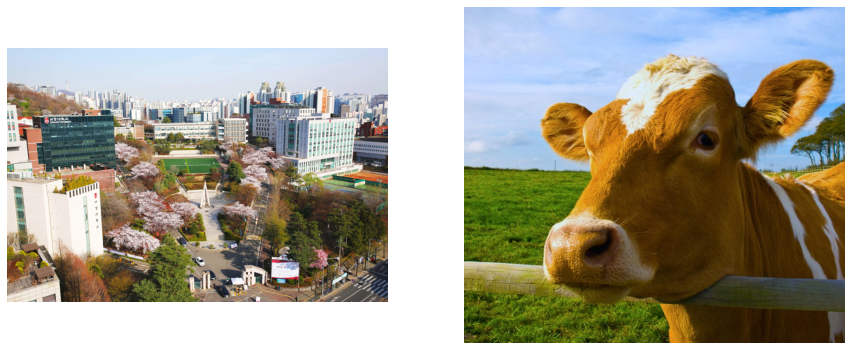

In [93]:
image_file = './pixels/sogang.jpg'
im = cv2.imread(image_file)[:,:,::-1]
imcow = cv2.imread("./pixels/cow.jpg")[:,:,::-1]
imshow([im, imcow])

---
# Smoothing Fiter 
---
- Does not preserve sharp edges or areas of high intensity changes

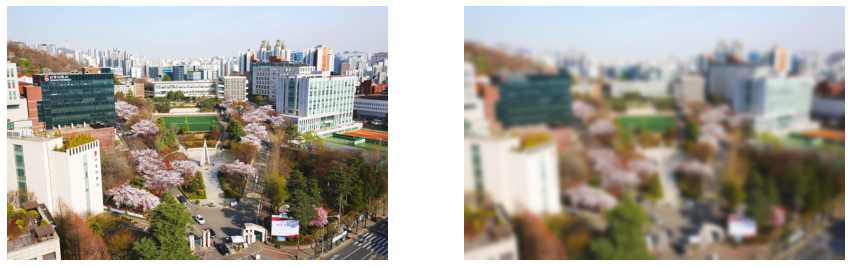

In [171]:
im_g = cv2.GaussianBlur(im, ksize=(21,21), sigmaX=0)
imshow([im, im_g])

---
## Edge Preserving Filter
---

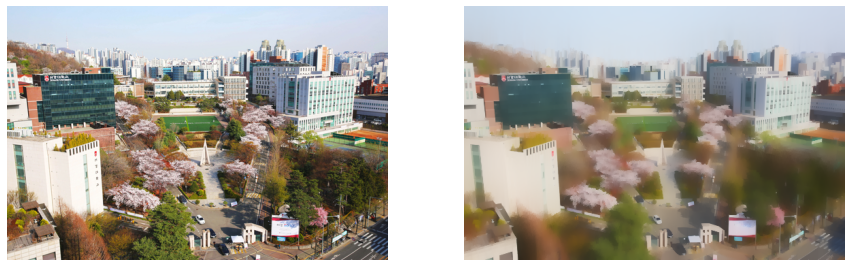

In [172]:
sigma_s = 200         # [0, 200]
sigma_r = 1         # [0, 1]
filtered = cv2.edgePreservingFilter(im, sigma_s=sigma_s, sigma_r=sigma_r, flags=1);
imshow([im, filtered]);

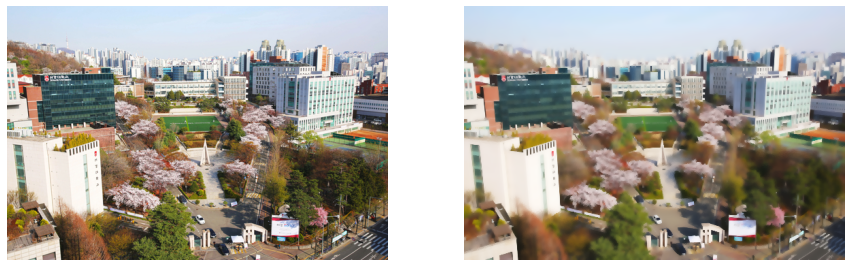

In [173]:
sigma_s = 3         # [0, 200]
sigma_r = 1.         # [0, 1]
filtered = cv2.edgePreservingFilter(im, sigma_s=sigma_s, sigma_r=sigma_r, flags=2);
imshow([im, filtered]);

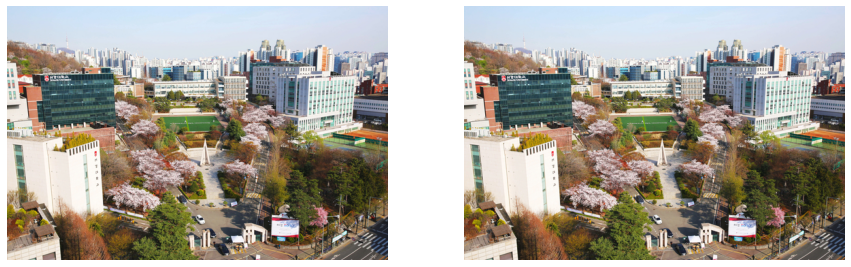

In [174]:
sigma_s = 3         # [0, 200]
sigma_r = 0.001         # [0, 1]
filtered = cv2.edgePreservingFilter(im, sigma_s=sigma_s, sigma_r=sigma_r, flags=2);
imshow([im, filtered]);

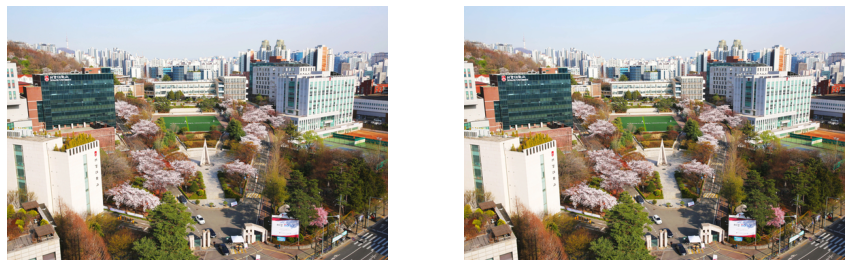

In [175]:
sigma_s = 200         # [0, 200]
sigma_r = 0.01         # [0, 1]
filtered = cv2.edgePreservingFilter(im, sigma_s=sigma_s, sigma_r=sigma_r, flags=2);
imshow([im, filtered]);

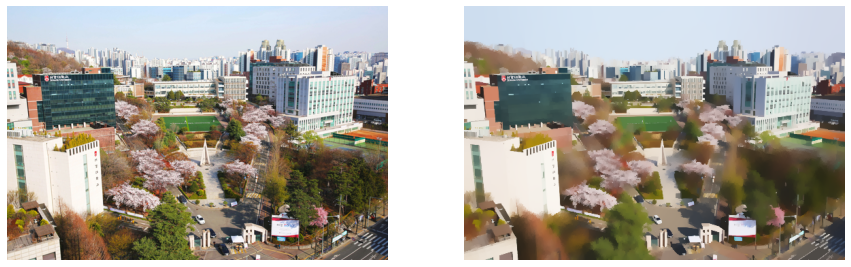

In [176]:
sigma_s = 100         # [0, 200]
sigma_r = 0.5         # [0, 1]
filtered = cv2.edgePreservingFilter(im, sigma_s=sigma_s, sigma_r=sigma_r, flags=2);
imshow([im, filtered]);

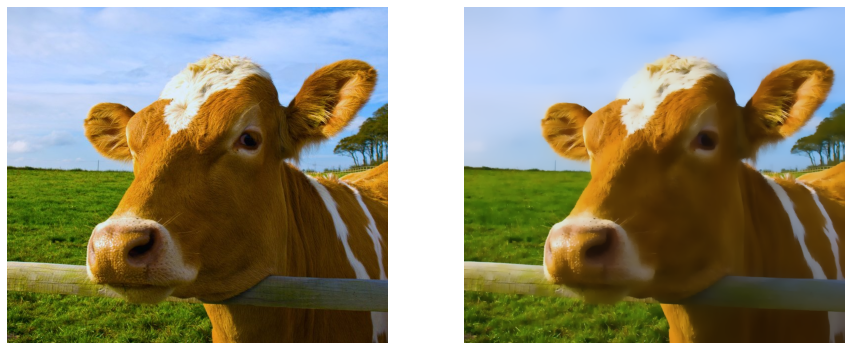

In [98]:
sigma_s = 60         # [0, 200]
sigma_r = 0.3         # [0, 1]

imshow([imcow, cv2.edgePreservingFilter(imcow, sigma_s=sigma_s, sigma_r=sigma_r, flags=1)]);

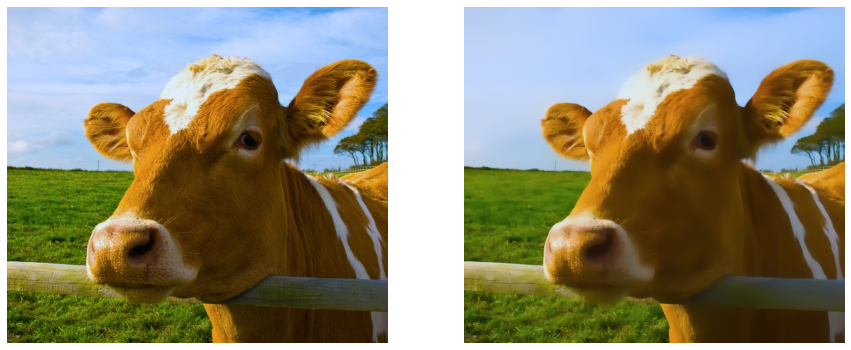

In [99]:
sigma_s = 200         # [0, 200]
sigma_r = 0.3         # [0, 1]

imshow([imcow, cv2.edgePreservingFilter(imcow, sigma_s=sigma_s, sigma_r=sigma_r, flags=1)]);

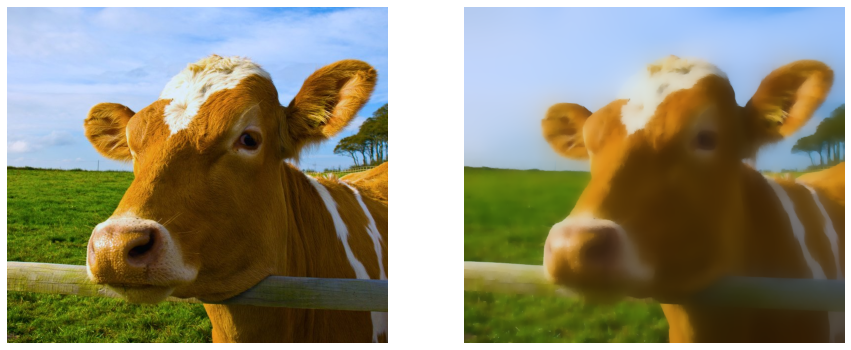

In [100]:
sigma_s = 60         # [0, 200]
sigma_r = 0.9         # [0, 1]

imshow([imcow, cv2.edgePreservingFilter(imcow, sigma_s=sigma_s, sigma_r=sigma_r, flags=1)]);

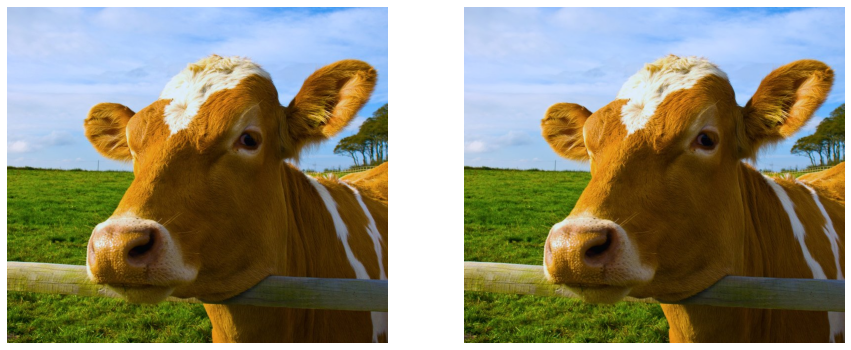

In [101]:
sigma_s = 200         # [0, 200]
sigma_r = 0.01         # [0, 1]

imshow([imcow, cv2.edgePreservingFilter(imcow, sigma_s=sigma_s, sigma_r=sigma_r, flags=1)]);

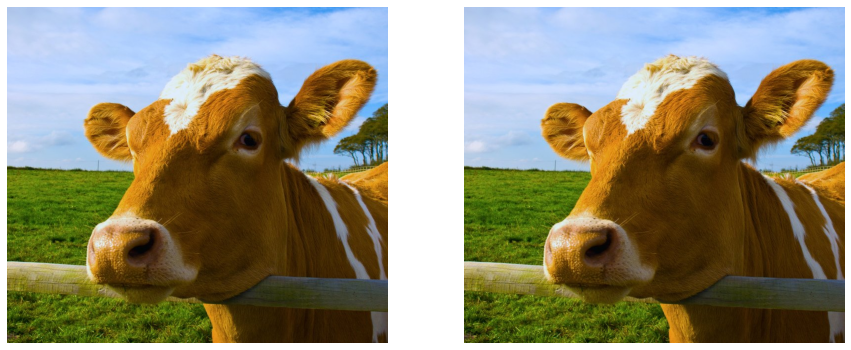

In [102]:
sigma_s = 0         # [0, 200]
sigma_r = 0.99         # [0, 1]

imshow([imcow, cv2.edgePreservingFilter(imcow, sigma_s=sigma_s, sigma_r=sigma_r, flags=1)]);

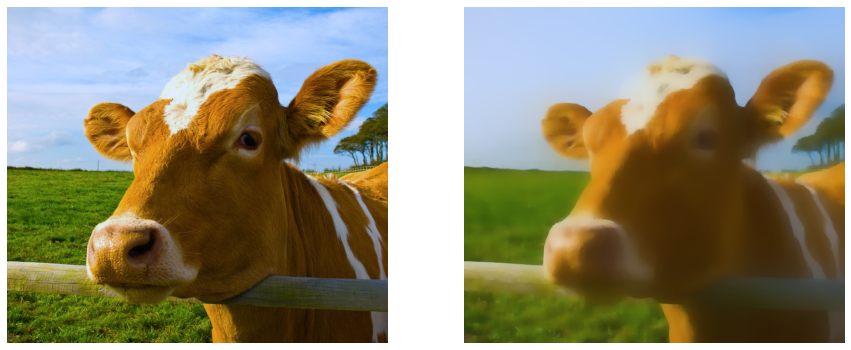

In [103]:
sigma_s = 200         # [0, 200]
sigma_r = 0.99         # [0, 1]

imshow([imcow, cv2.edgePreservingFilter(imcow, sigma_s=sigma_s, sigma_r=sigma_r, flags=1)]);

---
## Detail Enhancing Filter
---

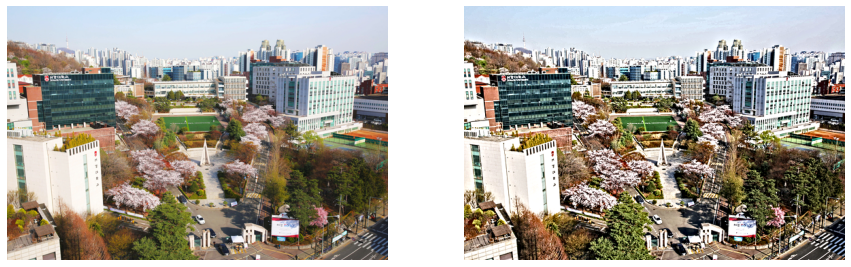

In [104]:
im_e1 = cv2.detailEnhance(im, sigma_s=10, sigma_r=.15)
imshow([im, im_e1])

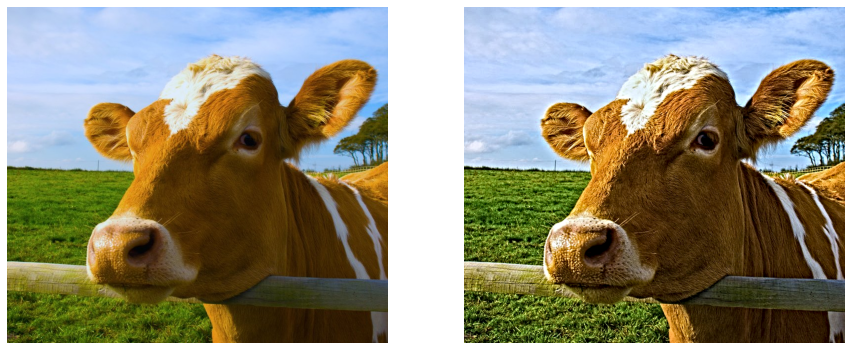

In [105]:
im_e2 = cv2.detailEnhance(imcow, sigma_s=10, sigma_r=.15)
imshow([imcow, im_e2])

---
# Pencil Sketch Filter
---

- `shade_factor` in [0, 0.1]

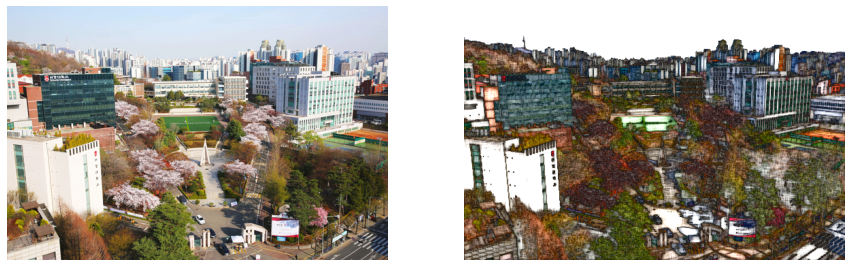

In [109]:
im_s1g, im_s1c = cv2.pencilSketch(im, sigma_s=60, sigma_r=.1, shade_factor=.05)
imshow([im, im_s1c])

In [111]:
im_s1g.shape, im_s1g[np.newaxis,:,:].shape

((373, 560), (1, 373, 560))

(3, 373, 560) (373, 560, 3)


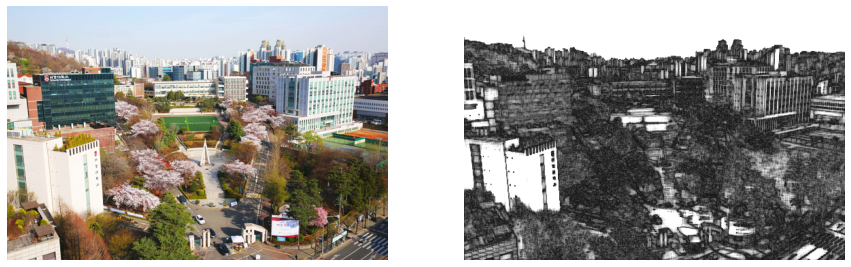

In [119]:
im_s1g3 = np.stack((im_s1g,im_s1g,im_s1g))
print(im_s1g3.shape, im_s1g3.transpose(1,2,0).shape)
im_s1g3 = im_s1g3.transpose(1,2,0)
imshow([im, im_s1g3])

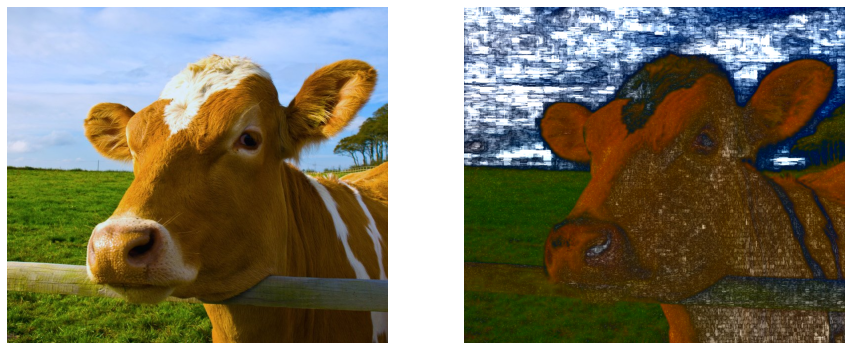

In [126]:
imcow_s1g, imcow_s1c = cv2.pencilSketch(imcow, sigma_s=60, sigma_r=.01, shade_factor=.05)
imshow([imcow, imcow_s1c])

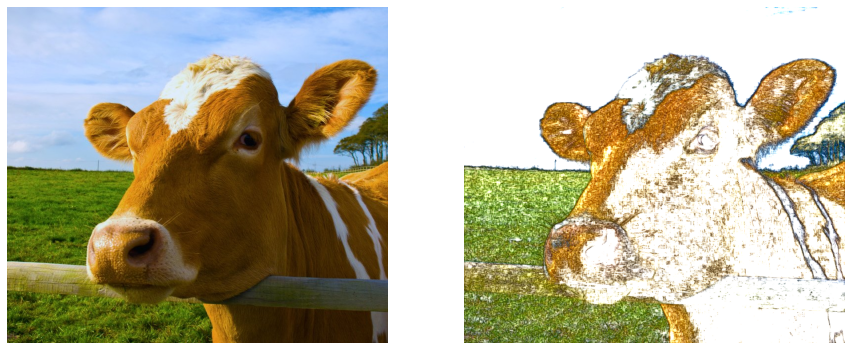

In [128]:
imcow_s1g, imcow_s1c = cv2.pencilSketch(imcow, sigma_s=60, sigma_r=.07, shade_factor=.095)
imshow([imcow, imcow_s1c])

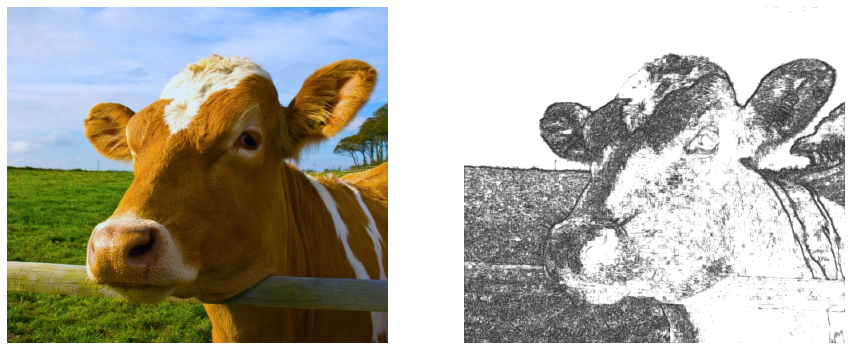

In [129]:
imcow_s1g3 = np.stack((imcow_s1g,imcow_s1g,imcow_s1g))
imcow_s1g3 = imcow_s1g3.transpose(1,2,0)
imshow([imcow, imcow_s1g3])

---
# Stylization
---

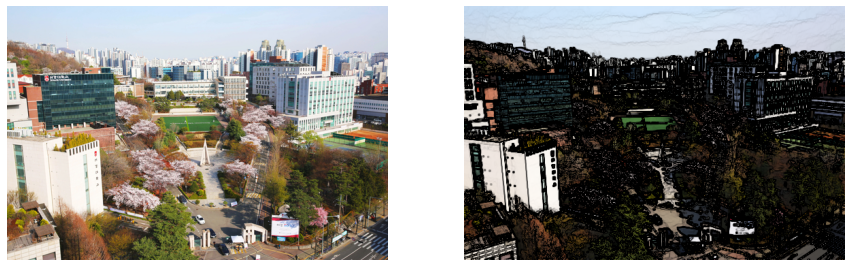

In [135]:
im_s = cv2.stylization(im, sigma_s=70, sigma_r=.05)
imshow([im, im_s])

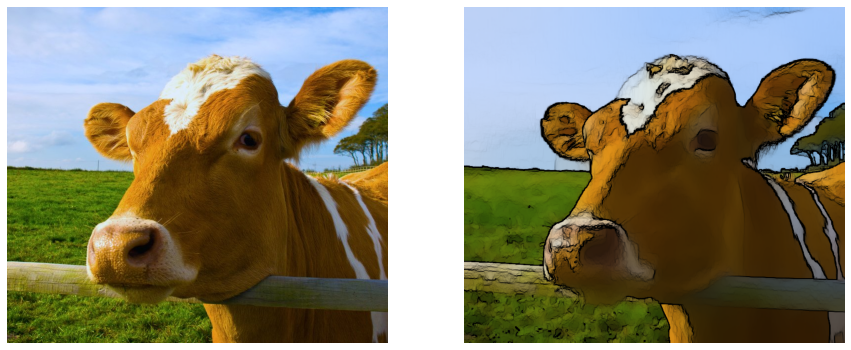

In [148]:
imcow_s = cv2.stylization(imcow, sigma_s=160, sigma_r=.5)
imshow([imcow, imcow_s])

---
# Video Application
---
- Parameter selection takes some time

In [162]:
video = cv2.VideoCapture("pixels/time-lapse-video-of-sunset-by-the-sea-854400.mp4")
fps = video.get(cv2.CAP_PROP_FPS)
fourcc = int(video.get(cv2.CAP_PROP_FOURCC))
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
print('fps', fps )
vout = cv2.VideoWriter("pixels/time-lapse-stylized.mp4", 
                       fourcc,
                       fps, 
                       (width, height))
while video.isOpened() == True:
    ret, frame = video.read()
    if not ret: break 
    styl = cv2.stylization(frame, sigma_s=160, sigma_r=.5)
    vout.write(styl)
    cv2.imshow("Window", styl)
    ch = cv2.waitKey(30)
    if ch == 27: break # ESC
#
vout.release()
video.release()
cv2.destroyAllWindows()

fps 29.97002997002997


In [151]:
dir(video)

['__class__',
 '__delattr__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 'get',
 'getBackendName',
 'getExceptionMode',
 'grab',
 'isOpened',
 'open',
 'read',
 'release',
 'retrieve',
 'set',
 'setExceptionMode']